EDA

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import sklearn

In [2]:
data = pd.read_csv('online_shoppers_intention.csv')
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


In [3]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [4]:
le.fit(data["Weekend"])
data["Weekend"] = le.transform(data["Weekend"])

le.fit(data["Revenue"])
data["Revenue"] = le.transform(data["Revenue"])

In [5]:
data["Month"].value_counts()
new_nums = {"Month":     {"May": 5, "Nov": 11, "Mar": 3, "Dec": 12, "Oct": 10, "Sep": 9, "Aug": 8, "Jul": 7, "June": 6, "Feb": 2}}
data = data.replace(new_nums)

In [6]:
data = pd.get_dummies(data, columns=['VisitorType'], prefix = ['VisitorType'])
data

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,1,1,1,1,0,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,2,2,2,1,2,0,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,2,4,1,9,3,0,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,2,3,2,2,4,0,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,2,3,3,1,4,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,12,4,6,1,1,1,0,0,0,1
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,11,3,2,1,8,1,0,0,0,1
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,11,3,2,1,13,1,0,0,0,1
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,11,2,2,3,11,0,0,0,0,1


In [7]:
def encode(data, col, max_val):
    data[col + '_sin'] = np.sin(2 * np.pi * data[col]/max_val)
    data[col + '_cos'] = np.cos(2 * np.pi * data[col]/max_val)
    return data

Text(0.5, 1.0, 'Transformed Feature Month')

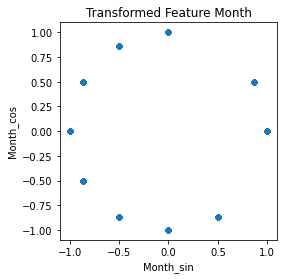

In [8]:
data = encode(data, 'Month', 12)
ax = data.plot.scatter('Month_sin', 'Month_cos').set_aspect('equal')
plt.title('Transformed Feature Month')

In [9]:
data[['Month','Month_sin', 'Month_cos']]

,Month,Month_sin,Month_cos
0,2,8.660254e-01,0.500000
1,2,8.660254e-01,0.500000
2,2,8.660254e-01,0.500000
3,2,8.660254e-01,0.500000
4,2,8.660254e-01,0.500000
...,...,...,...
12325,12,-2.449294e-16,1.000000
12326,11,-5.000000e-01,0.866025
12327,11,-5.000000e-01,0.866025
12328,11,-5.000000e-01,0.866025


In [10]:
l=[2,6,7,8,9,10,12,3,11,5]
for i in l:
    print(i)
    print(np.sin(2 * np.pi * i/12))
    print("---")

2
0.8660254037844386
---
6
1.2246467991473532e-16
---
7
-0.4999999999999998
---
8
-0.8660254037844384
---
9
-1.0
---
10
-0.8660254037844386
---
12
-2.4492935982947064e-16
---
3
1.0
---
11
-0.5000000000000004
---
5
0.49999999999999994
---


In [11]:
print(len(data))
data.isnull().sum()

12330


Administrative                   0
Administrative_Duration          0
Informational                    0
Informational_Duration           0
ProductRelated                   0
ProductRelated_Duration          0
BounceRates                      0
ExitRates                        0
PageValues                       0
SpecialDay                       0
Month                            0
OperatingSystems                 0
Browser                          0
Region                           0
TrafficType                      0
Weekend                          0
Revenue                          0
VisitorType_New_Visitor          0
VisitorType_Other                0
VisitorType_Returning_Visitor    0
Month_sin                        0
Month_cos                        0
dtype: int64

In [12]:
include='all'
data.describe(include=include)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Browser,Region,TrafficType,Weekend,Revenue,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor,Month_sin,Month_cos
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,...,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,1.233000e+04,1.233000e+04
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,...,2.357097,3.147364,4.069586,0.232603,0.154745,0.137388,0.006894,0.855718,5.960355e-02,7.282334e-02
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,...,1.717277,2.401591,4.025169,0.422509,0.361676,0.344271,0.082745,0.351390,6.294086e-01,7.714074e-01
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.000000e+00
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,...,2.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-5.000000e-01,-8.660254e-01
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,...,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-2.449294e-16,6.123234e-17
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157214,0.016813,0.050000,0.000000,0.000000,...,2.000000,4.000000,4.000000,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000e-01,8.660254e-01
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,...,13.000000,9.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00


In [13]:
data.dtypes

Administrative                     int64
Administrative_Duration          float64
Informational                      int64
Informational_Duration           float64
ProductRelated                     int64
ProductRelated_Duration          float64
BounceRates                      float64
ExitRates                        float64
PageValues                       float64
SpecialDay                       float64
Month                              int64
OperatingSystems                   int64
Browser                            int64
Region                             int64
TrafficType                        int64
Weekend                            int64
Revenue                            int64
VisitorType_New_Visitor            uint8
VisitorType_Other                  uint8
VisitorType_Returning_Visitor      uint8
Month_sin                        float64
Month_cos                        float64
dtype: object

In [14]:
import pandas_profiling
import pandas as pd
pd.read_csv('online_shoppers_intention.csv').profile_report()

Summarize dataset:   0%|          | 0/31 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
x = data[['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'Weekend', 'VisitorType_New_Visitor', 'VisitorType_Other',
       'VisitorType_Returning_Visitor', 'Month_sin', 'Month_cos']]
y=data["Revenue"]

In [16]:
x.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Weekend',
       'VisitorType_New_Visitor', 'VisitorType_Other',
       'VisitorType_Returning_Visitor', 'Month_sin', 'Month_cos'],
      dtype='object')

In [17]:
x.shape #13 features

(12330, 16)

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, train_size=0.8, random_state=101)

In [19]:
print(X_train.shape[0]/x.shape[0], X_test.shape[0]/x.shape[0])

0.8 0.2


In [20]:
y_test.describe()

count    2466.000000
mean        0.152068
std         0.359160
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: Revenue, dtype: float64

KNN: lazy learner

In [21]:
pd.DataFrame(X_train).describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor,Month_sin,Month_cos
count,9864.000000,9864.000000,9864.00000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9864.000000,9.864000e+03,9.864000e+03
mean,2.309915,80.507334,0.50811,34.917741,31.612429,1187.781849,0.022230,0.043106,5.860549,0.061192,0.232968,0.136760,0.006590,0.856650,5.878364e-02,7.265264e-02
std,3.306469,176.857302,1.28371,141.393072,44.116052,1921.573128,0.048453,0.048574,18.909836,0.198388,0.422744,0.343611,0.080913,0.350447,6.289361e-01,7.718847e-01
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000e+00,-1.000000e+00
25%,0.000000,0.000000,0.00000,0.000000,7.000000,182.906250,0.000000,0.014286,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-5.000000e-01,-8.660254e-01
50%,1.000000,8.000000,0.00000,0.000000,18.000000,598.680556,0.003107,0.025356,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-2.449294e-16,6.123234e-17
75%,4.000000,92.365625,0.00000,0.000000,38.000000,1464.701335,0.016845,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000e-01,8.660254e-01
max,27.000000,3398.750000,24.00000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000e+00,1.000000e+00


In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

params = {'n_neighbors':[3,5,11,19], 
          'weights': ['uniform', 'distance'],
         'metric': ['euclidean', 'manhattan', 'chebyshev']}
search=GridSearchCV(KNeighborsClassifier(),
               params,
               verbose=1,
               cv=3,
               n_jobs=-1)
results=search.fit(X_train, y_train)


Fitting 3 folds for each of 24 candidates, totalling 72 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done  72 out of  72 | elapsed:    5.9s finished


In [23]:
print("score:" , results.best_score_,"\n" ,"estimator:", results.best_estimator_,"\n" ,"results:", results.best_params_)


score: 0.8649635036496351 
 estimator: KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='chebyshev',
                     metric_params=None, n_jobs=None, n_neighbors=11, p=2,
                     weights='uniform') 
 results: {'metric': 'chebyshev', 'n_neighbors': 11, 'weights': 'uniform'}


In [24]:
best = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='chebyshev',
                     metric_params=None, n_jobs=None, n_neighbors=11, p=2,
                     weights='uniform')
best.fit(X_train, y_train)
y_pred = best.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2091
           1       0.68      0.27      0.39       375

    accuracy                           0.87      2466
   macro avg       0.78      0.62      0.66      2466
weighted avg       0.85      0.87      0.85      2466



MLP: eager learner

In [25]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(max_iter=100)
params2 = {
    'hidden_layer_sizes': [(16),(16,16),(16,16,16)], #single hidden layer
    #3 layers of 16 neurons for the 16 features
    #number of neurons you want at each layer, where the nth entry in the tuple represents the number of neurons in the nth layer of the MLP model
    'activation': ['tanh', 'relu','logistic'],
    'solver': ['sgd', 'adam','lbfgs'],
    'alpha': [0.0001,0.001,0.01, 0.05,0.5],
    'learning_rate': ['constant','adaptive','invscaling']}
from sklearn.model_selection import GridSearchCV
search2 = GridSearchCV(mlp, params2, n_jobs=-1, cv=3)
results2=search2.fit(X_train, y_train) 

In [26]:
print("score:" , results2.best_score_,"\n" ,"estimator:", results2.best_estimator_,"\n" ,"results:", results2.best_params_)

score: 0.8943633414436333 
 estimator: MLPClassifier(activation='logistic', alpha=0.05, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=16, learning_rate='adaptive',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False) 
 results: {'activation': 'logistic', 'alpha': 0.05, 'hidden_layer_sizes': 16, 'learning_rate': 'adaptive', 'solver': 'adam'}


In [27]:
best2 = MLPClassifier(activation='logistic', alpha=0.001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=16, learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=100,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)  
best2.fit(X_train, y_train)
y_pred2 = best2.predict(X_test)
print(classification_report(y_test, y_pred2))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      2091
           1       0.67      0.57      0.62       375

    accuracy                           0.89      2466
   macro avg       0.80      0.76      0.78      2466
weighted avg       0.89      0.89      0.89      2466



Random Forrest: interpretable

In [28]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(random_state=101)
params3 = { 
    'n_estimators': [100, 200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']}
search3 = GridSearchCV(estimator=rf, param_grid=params3,n_jobs=-1, cv= 3)
results3 = search3.fit(X_train, y_train)

In [29]:
print("score:" , results3.best_score_,"\n" ,"estimator:", results3.best_estimator_,"\n" ,"results:", results3.best_params_)


score: 0.903183292781833 
 estimator: RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False) 
 results: {'criterion': 'entropy', 'max_depth': 7, 'max_features': 'auto', 'n_estimators': 200}


In [30]:
best3 = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)
best3.fit(X_train, y_train)
y_pred3 = best3.predict(X_test)
print(classification_report(y_test, y_pred3))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2091
           1       0.76      0.57      0.65       375

    accuracy                           0.91      2466
   macro avg       0.84      0.77      0.80      2466
weighted avg       0.90      0.91      0.90      2466



Logistic Regression: linear classifier

In [31]:
import numpy as np
np.logspace(-3,3,7)
#1.e-3

array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])

In [32]:
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()
params4={
    "C":np.logspace(-3,3,7), 
    "penalty":["l1"],
    "solver":['liblinear']} #'liblinear’ is limited to one-versus-rest schemes
search4=GridSearchCV(logreg,params4,cv=3)
results4=search4.fit(X_train,y_train)

In [33]:
print("score:" , results4.best_score_,"\n" ,"estimator:", results4.best_estimator_,"\n" ,"results:", results4.best_params_)


score: 0.8866585563665855 
 estimator: LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False) 
 results: {'C': 0.001, 'penalty': 'l1', 'solver': 'liblinear'}


In [34]:
best4 = LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False) 
best4.fit(X_train, y_train)
y_pred4 = best4.predict(X_test)
print(classification_report(y_test, y_pred4))

              precision    recall  f1-score   support

           0       0.90      0.97      0.94      2091
           1       0.73      0.40      0.52       375

    accuracy                           0.89      2466
   macro avg       0.82      0.69      0.73      2466
weighted avg       0.87      0.89      0.87      2466



Text(0.5, 0, 'Grid Search Iterations')

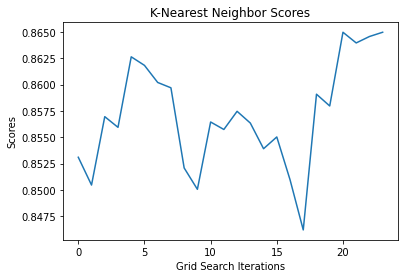

In [53]:
#check the other performances of other hyperparameters
#distribution of scores, standard deviation of scores
#how reliable is each model compared to their peak
#graphs ofdistribution of model
sns.lineplot(data=search.cv_results_['mean_test_score']).set(title='K-Nearest Neighbor Scores')
plt.ylabel('Scores', fontsize=10)
plt.xlabel('Grid Search Iterations', fontsize=10)

Text(0, 0.5, 'Count')

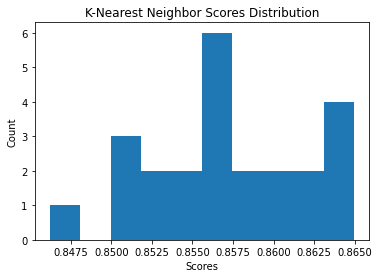

In [61]:
plt.hist(search.cv_results_['mean_test_score'])
plt.title('K-Nearest Neighbor Scores Distribution')
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Count', fontsize=10)

In [37]:
print("std dev:",np.std(search.cv_results_['mean_test_score']))
print("min:",min(search.cv_results_['mean_test_score']),"max:",max(search.cv_results_['mean_test_score']))

std dev: 0.0050403016495573095
min: 0.8462084347120844 max: 0.8649635036496351


Text(0.5, 0, 'Grid Search Iterations')

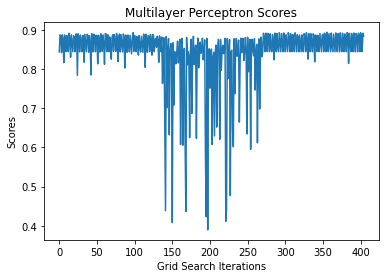

In [54]:
sns.lineplot(data=search2.cv_results_['mean_test_score']).set(title='Multilayer Perceptron Scores')
plt.ylabel('Scores', fontsize=10)
plt.xlabel('Grid Search Iterations', fontsize=10)

Text(0, 0.5, 'Count')

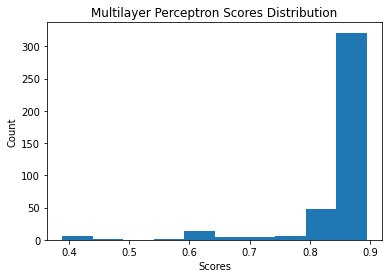

In [62]:
plt.hist(search2.cv_results_['mean_test_score'])
plt.title('Multilayer Perceptron Scores Distribution')
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Count', fontsize=10)

In [40]:
print("std dev:",np.std(search2.cv_results_['mean_test_score']))
print("min:",min(search2.cv_results_['mean_test_score']),"max:",max(search2.cv_results_['mean_test_score']))

std dev: 0.08256038394439613
min: 0.38919302514193027 max: 0.8943633414436333


Text(0.5, 0, 'Grid Search Iterations')

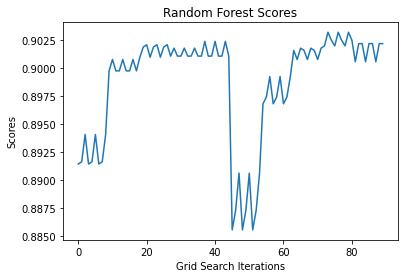

In [55]:
sns.lineplot(data=search3.cv_results_['mean_test_score']).set(title='Random Forest Scores')
plt.ylabel('Scores', fontsize=10)
plt.xlabel('Grid Search Iterations', fontsize=10)

In [64]:
print("std dev:",np.std(search3.cv_results_['mean_test_score']))
print("min:",min(search3.cv_results_['mean_test_score']),"max:",max(search3.cv_results_['mean_test_score']))

std dev: 0.004729850831625634
min: 0.8855433901054339 max: 0.903183292781833


Text(0, 0.5, 'Count')

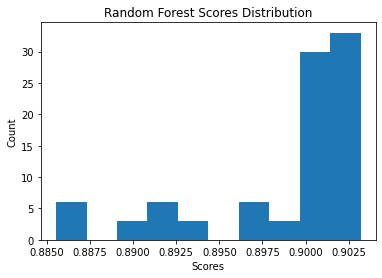

In [63]:
plt.hist(search3.cv_results_['mean_test_score'])
plt.title('Random Forest Scores Distribution')
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Count', fontsize=10)

In [44]:
print("std dev:",np.std(search4.cv_results_['mean_test_score']))
print("min:",min(search4.cv_results_['mean_test_score']),"max:",max(search4.cv_results_['mean_test_score']))

std dev: 0.0016418529394934824
min: 0.8813868613138687 max: 0.8866585563665855


Text(0.5, 0, 'Grid Search Iterations')

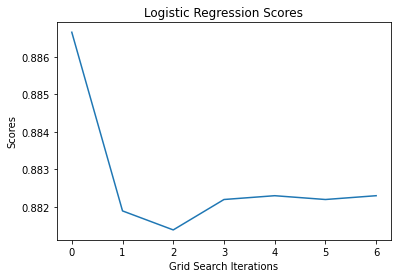

In [56]:
sns.lineplot(data=search4.cv_results_['mean_test_score']).set(title='Logistic Regression Scores')
plt.ylabel('Scores', fontsize=10)
plt.xlabel('Grid Search Iterations', fontsize=10)

Text(0, 0.5, 'Count')

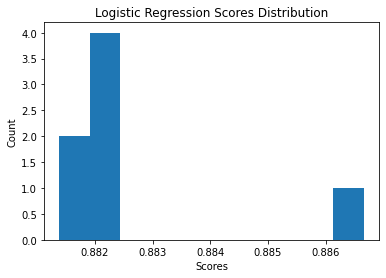

In [65]:
plt.hist(search4.cv_results_['mean_test_score'])
plt.title('Logistic Regression Scores Distribution')
plt.xlabel('Scores', fontsize=10)
plt.ylabel('Count', fontsize=10)

Feature Importance

In [47]:
model = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=7, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [48]:
def plot_feature_importance(importance,names,model_type):

    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + ' FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

In [49]:
X=['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Weekend',
       'VisitorType_New_Visitor', 'VisitorType_Other',
       'VisitorType_Returning_Visitor', 'Month_sin', 'Month_cos']

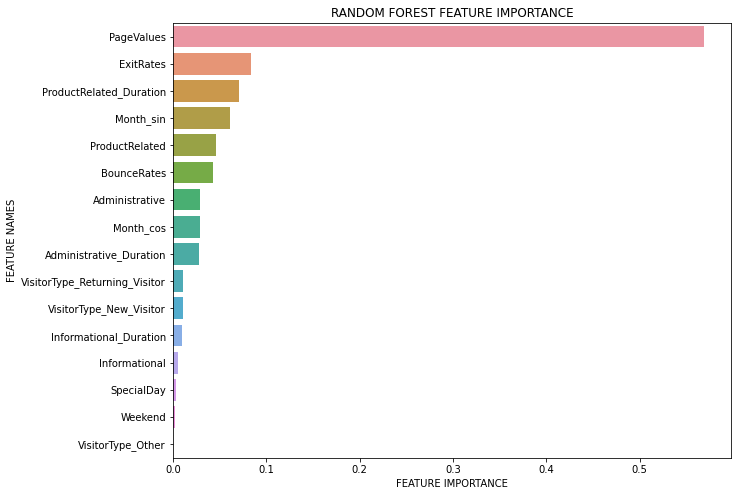

In [50]:
plot_feature_importance(model.feature_importances_,X,'RANDOM FOREST')
#seasonality of month sin and month cos

In [51]:
from sklearn.metrics import confusion_matrix
y_predm = model.predict(X_test)
CM = confusion_matrix(y_test, y_predm)
TN = CM[0][0]
FN = CM[1][0]
TP = CM[1][1]
FP = CM[0][1]
print("true negative:", TN,",", "false negative:", FN,",", "true positive:", TP,",", "false positive:", FP,",", "total:", TN+FN+TP+FP)

true negative: 2022 , false negative: 160 , true positive: 215 , false positive: 69 , total: 2466


In [52]:
import pandas as pd
data = {'Model':  ['K-Nearest Neighbor','Multilayer Perceptron', 'Random Forest', 'Logistic Regression'],
        'F1 Score': [0.85,0.89, 0.90, 0.87],
        'Std Dev of Grid Search Scores': [0.0050,0.082,0.0047, 0.0016]
        }
pd.DataFrame(data)

,Model,F1 Score,Std Dev of Grid Search Scores
0,K-Nearest Neighbor,0.85,0.0050
1,Multilayer Perceptron,0.89,0.0749
2,Random Forest,0.90,0.0047
3,Logistic Regression,0.87,0.0016
